In [69]:
import pandas as pd
import numpy as np
import time # for timefunc
#from pymongo import MongoClient

# graphing imports
# import matplotlib.pyplot as plt
# %matplotlib inline

%matplotlib notebook
import matplotlib.pyplot as plt

import seaborn as sns

# sklearn analysis imports
from sklearn import pipeline, preprocessing
from sklearn.preprocessing import Normalizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn import decomposition
from sklearn.decomposition import TruncatedSVD, LatentDirichletAllocation

# nltk imports
import nltk
from nltk import grammar

#lda
from gensim import corpora, models, similarities, matutils, models

# for LDA vis
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

## Import Data

In [2]:
# from http://stackoverflow.com/questions/30088006/cant-figure-out-how-to-fix-the-error-in-the-following-code
# was getting valueerror with strait read json

with open('bills.json', 'rb') as f:
    data = f.readlines()
# remove the trailing "\n" from each line
data = map(lambda x: x.rstrip(), data)
data_json_str = "[" + ','.join(data) + "]"

# now, load it into pandas
df = pd.read_json(data_json_str)

In [3]:
df.head()

//anaconda/lib/python2.7/site-packages/IPython/core/formatters.py:92: DeprecationWarning: DisplayFormatter._ipython_display_formatter_default is deprecated: use @default decorator instead.
  def _ipython_display_formatter_default(self):
//anaconda/lib/python2.7/site-packages/IPython/core/formatters.py:669: DeprecationWarning: PlainTextFormatter._singleton_printers_default is deprecated: use @default decorator instead.
  def _singleton_printers_default(self):


,_id,bill_text,party,sponsor,title
0,{u'$oid': u'581c049309f18010ec496100'},"<pre id=""billTextContainer"">\n[Congressional B...",Democrat,"<a href=""https://www.congress.gov/member/bill-...",H.R.6178 - Fair Allocation of Highway Funds Ac...
1,{u'$oid': u'581c049309f18010ec496101'},"<pre id=""billTextContainer"">\n[Congressional B...",Democrat,"<a href=""https://www.congress.gov/member/steve...",H.R.6051 - Local Medicaid Enforcement Incentiv...
2,{u'$oid': u'581c049409f18010ec496102'},"<pre id=""billTextContainer"">\n[Congressional B...",Republican,"<a href=""https://www.congress.gov/member/rober...",H.R.6184 - Medicare Enrollment Protection Act
3,{u'$oid': u'581c049509f18010ec496103'},"<pre id=""billTextContainer"">\n[Congressional B...",Republican,"<a href=""https://www.congress.gov/member/steve...",H.R.6124 - HOMeS Act of 2016
4,{u'$oid': u'581c049509f18010ec496104'},"<pre id=""billTextContainer"">\n[Congressional B...",Democrat,"<a href=""https://www.congress.gov/member/bill-...",H.R.6204 - No Cost Educational Resources Act


In [70]:
df.shape

(18669, 5)

## Word Cloud Visualization - Individual Bills

In [4]:
# from https://github.com/amueller/word_cloud/blob/master/examples/simple.py

# doesn't seem easy to incorporate with nmf output
# base version

from wordcloud import WordCloud

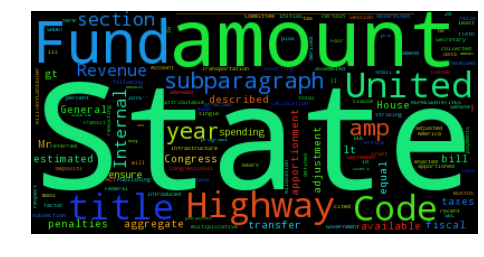

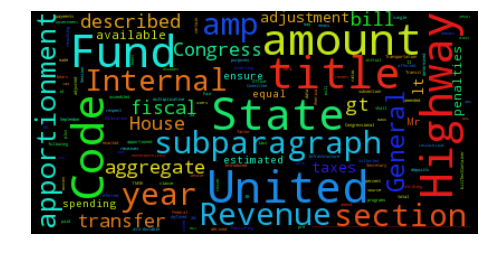

In [5]:
doc = df['bill_text'][0]

# Generate a word cloud image
wordcloud = WordCloud().generate(doc)

# Display the generated image:
# the matplotlib way:

plt.imshow(wordcloud)
plt.axis("off")

# lower max_font_size
wordcloud = WordCloud(max_font_size=40).generate(doc)
plt.figure()
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


## Vectorization and Transformation

In [19]:
# tried TFIDF vectorizer, much lower explained variance
# used less restrictive count vectorization (lower min_df, higher max_df
# and got higher feature-1 variance explained)

tf_vectorizer = CountVectorizer(min_df = 25, max_df=.15).fit(df['bill_text'])
tf_vectorizer.vocabulary_

{u'deferment': 5439,
 u'woods': 13889,
 u'woody': 13890,
 u'localized': 8758,
 u'refunding': 11160,
 u'unnecessarily': 13393,
 u'pages': 9916,
 u'appropriation': 3394,
 u'bringing': 4016,
 u'four': 7089,
 u'liaisons': 8651,
 u'grains': 7335,
 u'immunities': 7789,
 u'270': 1274,
 u'271': 1284,
 u'272': 1289,
 u'273': 1291,
 u'274': 1292,
 u'275': 1296,
 u'276': 1299,
 u'sustaining': 12745,
 u'278': 1306,
 u'279': 1308,
 u'1070a': 188,
 u'errors': 6440,
 u'tiered': 12984,
 u'cooking': 5059,
 u'aggression': 3108,
 u'designing': 5617,
 u'affiliates': 3068,
 u'47': 1837,
 u'china': 4384,
 u'affiliated': 3067,
 u'kids': 8444,
 u'deferring': 5443,
 u'controversy': 5028,
 u'appropriately': 3391,
 u'topography': 13039,
 u'projection': 10640,
 u'dna': 5963,
 u'insecurity': 8077,
 u'music': 9345,
 u'therefore': 12930,
 u'distortions': 5920,
 u'populations': 10306,
 u'expeditionary': 6616,
 u'circumstances': 4414,
 u'intake': 8144,
 u'locked': 8766,
 u'interaction': 8172,
 u'unjust': 13378,
 u'wan

In [20]:
# now we convert the vector to a sparse matrix
text_matrix = tf_vectorizer.transform(df['bill_text'])
text_matrix

<18669x13988 sparse matrix of type '<type 'numpy.int64'>'
	with 3604326 stored elements in Compressed Sparse Row format>

In [21]:
text_matrix.shape

(18669, 13988)

## Latent Semantic Analysis - LSA

In [22]:
# Fit LSA. Use algorithm = “randomized” for large datasets 
lsa = TruncatedSVD(10, algorithm = 'randomized')
text_lsa = lsa.fit_transform(text_matrix)
text_lsa = Normalizer(copy=False).fit_transform(text_lsa)

In [23]:
print (lsa.explained_variance_ratio_.sum())
lsa.explained_variance_ratio_

0.782548669724


array([ 0.47686752,  0.13750849,  0.04090544,  0.03736725,  0.02185802,
        0.01714919,  0.01517117,  0.01439155,  0.01107974,  0.01025029])

## Nonnegative Matrix Factorization - NMF

In [35]:
model = decomposition.NMF(init="nndsvd", n_components=20, max_iter=1000) # n_comp = # topics
W = model.fit_transform(text_matrix) # text should be sparse matrix
H = model.components_
words = tf_vectorizer.get_feature_names()

for topic_index in range( H.shape[0] ):
    top_indices = np.argsort( H[topic_index,:] )[::-1][0:20]
    term_ranking = [words[i] for i in top_indices]
    print "Topic %d: %s" % ( topic_index, ", ".join( term_ranking ) )

Topic 0: deleted, literacy, english, technology, school, student, learning, postal, amtrak, achievement, college, schools, need, performance, rail, high, early, academic, instruction, students
Topic 1: defense, military, forces, air, force, army, armed, acquisition, committees, systems, operations, navy, equipment, technology, joint, nuclear, procurement, aircraft, reserve, personnel
Topic 2: expenses, remain, fund, committees, expended, heading, none, transfer, budget, housing, appropriation, operations, transferred, salaries, foreign, international, obligation, emergency, maintenance, project
Topic 3: educational, school, children, students, schools, student, academic, subpart, high, english, achievement, teachers, secondary, child, youth, native, charter, learning, language, instruction
Topic 4: food, loan, agricultural, farm, conservation, agriculture, land, crop, rural, subtitle, producer, 2018, payments, dairy, production, commodity, contract, loans, nutrition, producers
Topic 5:

In [36]:
print (H.shape) # H is topics by words matrix
print (W.shape) # W is documents by topics matrix

(20, 13988)
(18669, 20)


In [37]:
print (W[1].sum())
print (W[1])

0.0758953197917
[ 0.          0.          0.01181356  0.          0.00229373  0.          0.
  0.          0.0011928   0.          0.          0.00683076  0.          0.
  0.          0.05376447  0.          0.          0.          0.        ]


In [44]:
# I'm not sure what's happening here, the topics below are really not matching up with the topics in the below vis

nmf_display = pyLDAvis.sklearn.prepare(model, text_matrix, tf_vectorizer)
nmf_display

PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
15     11.103025        1       1 -0.120854  0.014674
11      8.086379        1       2  0.013911 -0.128488
17      7.281510        1       3 -0.022955 -0.038185
10      7.107110        1       4  0.089788  0.015855
1       6.992388        1       5  0.078508 -0.012920
13      6.314459        1       6  0.020111 -0.169928
2       5.137276        1       7  0.045124 -0.085792
12      4.889144        1       8 -0.067494 -0.039964
9       4.745796        1       9 -0.023971 -0.018598
3       4.309324        1      10 -0.192272  0.172383
8       4.275048        1      11 -0.061187 -0.073514
4       4.061689        1      12  0.000597 -0.036273
16      3.822414        1      13 -0.163164  0.037456
6       3.817474        1      14  0.010871 -0.048517
14      3.710431        1      15 -0.039529 -0.168494
0       3.577074        1      16 -0.093041  0.294563
5       3.551697        1      17 -0.133479  0.043448
19      3.221755        1      18  0.074594  0.010711
7       2.791503        1      19  0.290166  0.164561
18      1.204505        1      20  0.294277  0.067024, topic_info=      Category           Freq           Term          Total  loglift  logprob
term                                                                         
5479   Default  215570.000000        deleted  215570.000000  30.0000  30.0000
13580  Default   46176.000000       veterans   46176.000000  29.0000  29.0000
8508   Default   42416.000000           land   42416.000000  28.0000  28.0000
13839  Default   22710.000000     wilderness   22710.000000  27.0000  27.0000
13738  Default   35084.000000          water   35084.000000  26.0000  26.0000
2996   Default   31969.000000  administrator   31969.000000  25.0000  25.0000
12387  Default   26321.000000           stat   26321.000000  24.0000  24.0000
9558   Default   26478.000000           note   26478.000000  23.0000  23.0000
5434   Default   34855.000000        defense   34855.000000  22.0000  22.0000
9915   Default   19245.000000           page   19245.000000  21.0000  21.0000
5098   Default   29085.000000    corporation   29085.000000  20.0000  20.0000
6149   Default   27269.000000    educational   27269.000000  19.0000  19.0000
12812  Default   21711.000000        taxable   21711.000000  18.0000  18.0000
7522   Default   17564.000000        heading   17564.000000  17.0000  17.0000
11838  Default   26783.000000         school   26783.000000  16.0000  16.0000
8747   Default   30756.000000           loan   30756.000000  15.0000  15.0000
3165   Default   17168.000000          alien   17168.000000  14.0000  14.0000
10636  Default   40914.000000        project   40914.000000  13.0000  13.0000
9277   Default   15287.000000       mortgage   15287.000000  12.0000  12.0000
7028   Default   16267.000000         forest   16267.000000  11.0000  11.0000
12510  Default   21234.000000       students   21234.000000  10.0000  10.0000
12509  Default   20635.000000        student   20635.000000   9.0000   9.0000
8112   Default   22017.000000    institution   22017.000000   8.0000   8.0000
6264   Default   22790.000000     employment   22790.000000   7.0000   7.0000
7024   Default   38457.000000        foreign   38457.000000   6.0000   6.0000
8136   Default   27740.000000      insurance   27740.000000   5.0000   5.0000
4332   Default   11791.000000         change   11791.000000   4.0000   4.0000
3401   Default   11759.000000  approximately   11759.000000   3.0000   3.0000
7892   Default   26408.000000         income   26408.000000   2.0000   2.0000
12522  Default   15041.000000     subchapter   15041.000000   1.0000   1.0000
...        ...            ...            ...            ...      ...      ...
12541  Topic20    4415.304314     subheading    5123.369259   4.2704  -3.5266
20     Topic20     848.096692             02     984.563446   4.2699  -5.1764
10915  Topic20     204.593720       rea

In [45]:
# saving the visualization as an html file
# general form: pyLDAvis.save_html(data, fileobj, **kwargs)

pyLDAvis.save_html(nmf_display, 'nmf_display.html')

In [ ]:
#note: saved file works perfectly well when run independently in chrome on a local machine.

## Sending Data Back to MongoDB

In [ ]:
# now we need to send some of this analysis back into the mongo_db

# specifically, we need to normalize the values on the document-by-topic matrix, then append the normalized values
# of the component(topic)-weights to the core df's row associated with the document
# this will allow us to call a single document by title or id and then show the user a topic distribution and a word cloud associated with
# that document specifically, as well as the nmf for the corpus as a whole

# note: if we had a local copy of the mongo_db we could probably do this far more simply.

print (W.shape) # W is documents by topics matrix

In [74]:
#get a matrix that shows the composition of topics (we're using components as a proxy for topics) within a document

doc_by_comp_matrix = W.copy()
print(doc_by_comp_matrix.shape)
# normalizes for improved interperability; the sum of doc_by_comp_matrix[row] == 1
# "a given document is x% topic #5, y% topic #12, ..." etc
doc_by_comp_matrix = (doc_by_comp_matrix.T / doc_by_comp_matrix.sum(axis=1)).T
print doc_by_comp_matrix[1].sum()
doc_by_comp_matrix[1]

(18669, 20)
1.0


array([ 0.        ,  0.        ,  0.15565595,  0.        ,  0.03022231,
        0.        ,  0.        ,  0.        ,  0.01571643,  0.        ,
        0.        ,  0.09000232,  0.        ,  0.        ,  0.        ,
        0.70840298,  0.        ,  0.        ,  0.        ,  0.        ])

In [64]:
# get a dataframe of these components

topic_df = pd.DataFrame(doc_by_comp_matrix)
topic_df = topic_df.rename(columns={0:'Topic_0', 1:'Topic_1', 2:'Topic_2', 3:'Topic_3', 4:'Topic_4', 5:'Topic_5', 
                                    6:'Topic_6', 7:'Topic_7', 8:'Topic_8', 9:'Topic_9', 10:'Topic_10', 11:'Topic_11',
                                    12:'Topic_12', 13:'Topic_13', 14:'Topic_14', 15:'Topic_15', 16:'Topic_16', 17:'Topic_17', 
                                    18:'Topic_18', 19:'Topic_19'})
topic_df.head()

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14,Topic_15,Topic_16,Topic_17,Topic_18,Topic_19
0,0.0,0.000000,0.222392,0.000000,0.000000,0.0,0.0,0.000342,0.017890,0.462494,0.0,0.000000,0.000000,0.234090,0.062793,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.0,0.000000,0.155656,0.000000,0.030222,0.0,0.0,0.000000,0.015716,0.000000,0.0,0.090002,0.000000,0.000000,0.000000,0.708403,0.000000,0.000000,0.000000,0.000000
2,0.0,0.000000,0.000000,0.000000,0.087469,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.128236,0.000000,0.784296,0.000000,0.000000,0.000000,0.000000
3,0.0,0.459207,0.000000,0.068982,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.024477,0.285747,0.000000,0.161587,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.0,0.005536,0.000000,0.394142,0.000000,0.0,0.0,0.000000,0.000000,0.050162,0.0,0.014489,0.031243,0.000000,0.000000,0.000000,0.475428,0.016478,0.004996,0.007526


In [67]:
# we're still going to need some key to reference to make sure we're matching in the actual DB
# so let's combine this with the core dataframe
all_info = pd.merge(df, topic_df, how='outer', right_index=True, left_index=True)
print (all_info.shape)
all_info.head()

(18669, 25)


,_id,bill_text,party,sponsor,title,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,...,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14,Topic_15,Topic_16,Topic_17,Topic_18,Topic_19
0,{u'$oid': u'581c049309f18010ec496100'},"<pre id=""billTextContainer"">\n[Congressional B...",Democrat,"<a href=""https://www.congress.gov/member/bill-...",H.R.6178 - Fair Allocation of Highway Funds Ac...,0.0,0.000000,0.222392,0.000000,0.000000,...,0.0,0.000000,0.000000,0.234090,0.062793,0.000000,0.000000,0.000000,0.000000,0.000000
1,{u'$oid': u'581c049309f18010ec496101'},"<pre id=""billTextContainer"">\n[Congressional B...",Democrat,"<a href=""https://www.congress.gov/member/steve...",H.R.6051 - Local Medicaid Enforcement Incentiv...,0.0,0.000000,0.155656,0.000000,0.030222,...,0.0,0.090002,0.000000,0.000000,0.000000,0.708403,0.000000,0.000000,0.000000,0.000000
2,{u'$oid': u'581c049409f18010ec496102'},"<pre id=""billTextContainer"">\n[Congressional B...",Republican,"<a href=""https://www.congress.gov/member/rober...",H.R.6184 - Medicare Enrollment Protection Act,0.0,0.000000,0.000000,0.000000,0.087469,...,0.0,0.000000,0.000000,0.128236,0.000000,0.784296,0.000000,0.000000,0.000000,0.000000
3,{u'$oid': u'581c049509f18010ec496103'},"<pre id=""billTextContainer"">\n[Congressional B...",Republican,"<a href=""https://www.congress.gov/member/steve...",H.R.6124 - HOMeS Act of 2016,0.0,0.459207,0.000000,0.068982,0.000000,...,0.0,0.024477,0.285747,0.000000,0.161587,0.000000,0.000000,0.000000,0.000000,0.000000
4,{u'$oid': u'581c049509f18010ec496104'},"<pre id=""billTextContainer"">\n[Congressional B...",Democrat,"<a href=""https://www.congress.gov/member/bill-...",H.R.6204 - No Cost Educational Resources Act,0.0,0.005536,0.000000,0.394142,0.000000,...,0.0,0.014489,0.031243,0.000000,0.000000,0.000000,0.475428,0.016478,0.004996,0.007526


In [65]:
# we're maybe going to want to export this in some form since the actual mongoDB is saved on another machine

# from: https://gist.github.com/adamgreenhall/4755513

"""
tiny script to convert a pandas data frame into a JSON object
"""
 
import json as json

def df_to_json(df, filename=''):
    x = df.reset_index().T.to_dict().values()
    if filename:
        with open(filename, 'w+') as f: f.write(json.dumps(x))
    return x


In [68]:
df_to_json(all_info, filename='everything.json')

[{'Topic_0': 0.0,
  'Topic_1': 0.0,
  'Topic_10': 0.0,
  'Topic_11': 0.0,
  'Topic_12': 0.0,
  'Topic_13': 0.23408978385701945,
  'Topic_14': 0.06279329672463989,
  'Topic_15': 0.0,
  'Topic_16': 0.0,
  'Topic_17': 0.0,
  'Topic_18': 0.0,
  'Topic_19': 0.0,
  'Topic_2': 0.222391662976939,
  'Topic_3': 0.0,
  'Topic_4': 0.0,
  'Topic_5': 0.0,
  'Topic_6': 0.0,
  'Topic_7': 0.000341553097844974,
  'Topic_8': 0.017889530745651,
  'Topic_9': 0.46249417259790576,
  u'_id': {u'$oid': u'581c049309f18010ec496100'},
  u'bill_text': u'<pre id="billTextContainer">\n[Congressional Bills 114th Congress]\n[From the U.S. Government Publishing Office]\n[H.R. 6178 Introduced in House (IH)]\n\n&amp;lt;DOC&amp;gt;\n\n\n\n\n\n\n114th CONGRESS\n  2d Session\n                                H. R. 6178\n\n To amend title 23, United States Code, with respect to apportionments \n    to States for certain highway programs, and for other purposes.\n\n\n____________________________________________________________

# ---

## LDA

#### Alternate Vectorization and Transformation

In [40]:
# for TF DTM
# lda_tf = LatentDirichletAllocation(n_topics=20, random_state=0, n_jobs=-4)
# lda_tf.fit(text_matrix) #text_matrix is the document-term-matrix (sparse matrix)


In [41]:
# len(lda_tf.components_)

In [42]:
#pyLDAvis.sklearn.prepare(lda_tf, text_matrix, tf_vectorizer)